TP ARBRES DE DECISIONS
FICHIER CSV 8

Problème I : Arbres de décision, une application
sur des données réelle

Analyse descriptive des data

In [4]:
#import des librairies et fonctions utiles
import pandas as pd
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline
import matplotlib
import seaborn as sns
import math

matplotlib.rcParams['figure.dpi'] = 300
matplotlib.rcParams['figure.figsize'] = (15, 8)
matplotlib.rcParams['savefig.format'] = 'svg'
df = pd.read_csv('data.csv')
df.head()

,Marital Status;Application mode;Application order;Course;Daytime/evening attendance;Previous qualification;Previous qualification (grade);Nacionality;Mother's qualification;Father's qualification;Mother's occupation;Father's occupation;Admission grade;Displaced;Educational special needs;Debtor;Tuition fees up to date;Gender;Scholarship holder;Age at enrollment;International;Curricular units 1st sem (credited);Curricular units 1st sem (enrolled);Curricular units 1st sem (evaluations);Curricular units 1st sem (approved);Curricular units 1st sem (grade);Curricular units 1st sem (without evaluations);Curricular units 2nd sem (credited);Curricular units 2nd sem (enrolled);Curricular units 2nd sem (evaluations);Curricular units 2nd sem (approved);Curricular units 2nd sem (grade);Curricular units 2nd sem (without evaluations);Unemployment rate;Inflation rate;GDP;Class
0,1;17;5;171;1;1;122.0;1;19;12;5;9;127.3;1;0;0;1...
1,1;15;1;9254;1;1;160.0;1;1;3;3;3;142.5;1;0;0;0;...
2,1;1;5;9070;1;1;122.0;1;37;37;9;9;124.8;1;0;0;0...
3,1;17;2;9773;1;1;122.0;1;38;37;5;3;119.6;1;0;0;...
4,2;39;1;8014;0;1;100.0;1;37;38;9;9;141.5;0;0;0;...


In [19]:
#Separation de toutes les colonnes avec le splits ";"
df_split = df[df.columns[0]].str.split(';', expand=True)

#Ajout des noms de colonnes
df_split.columns = df.columns[0].split(';')

# Première vision de statistique
df_split.describe(include='all')

,Marital Status,Application mode,Application order,Course,Daytime/evening attendance,Previous qualification,Previous qualification (grade),Nacionality,Mother's qualification,Father's qualification,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Class
count,3630,3630,3630,3630,3630,3630,3630,3630,3630,3630,...,3630,3630,3630,3630,3630,3630,3630,3630,3630,3630
unique,6,18,7,17,2,17,101,19,29,34,...,19,22,29,20,720,10,10,9,10,2
top,1,1,1,9500,1,1,133.1,1,1,37,...,0,6,8,6,0.0,0,7.6,1.4,0.32,Graduate
freq,3199,1408,2461,666,3222,3019,426,3544,865,1010,...,3183,1596,654,867,802,3416,452,726,452,2209


In [20]:
# Calculer les statistiques max, min, étendue et moyenne pour chaque colonne numérique

# On sélectionne uniquement les colonnes numériques (après conversion)
df_numeric = df_split.apply(pd.to_numeric, errors='coerce')

stats = pd.DataFrame({
    'min': df_numeric.min(),
    'max': df_numeric.max(),
    'étendue': df_numeric.max() - df_numeric.min(),
    'moyenne': df_numeric.mean()
})

stats

,min,max,étendue,moyenne
Marital Status,1.00,6.000000,5.000000,1.184298
Application mode,1.00,57.000000,56.000000,18.421763
Application order,0.00,6.000000,6.000000,1.750138
Course,33.00,9991.000000,9958.000000,8853.980992
Daytime/evening attendance,0.00,1.000000,1.000000,0.887603
Previous qualification,1.00,43.000000,42.000000,4.532231
Previous qualification (grade),95.00,190.000000,95.000000,132.920606
Nacionality,1.00,109.000000,108.000000,1.828099
Mother's qualification,1.00,44.000000,43.000000,19.986226
Father's qualification,1.00,44.000000,43.000000,22.571625


On se rend compte que notre conversion à changer la Class en NaN, il faudra faire attention à bien utiliser df_split pour retrouver la class

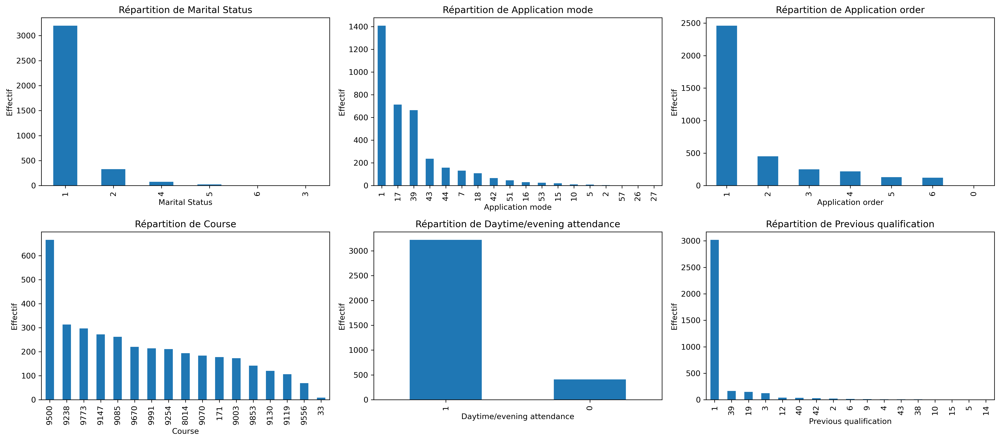

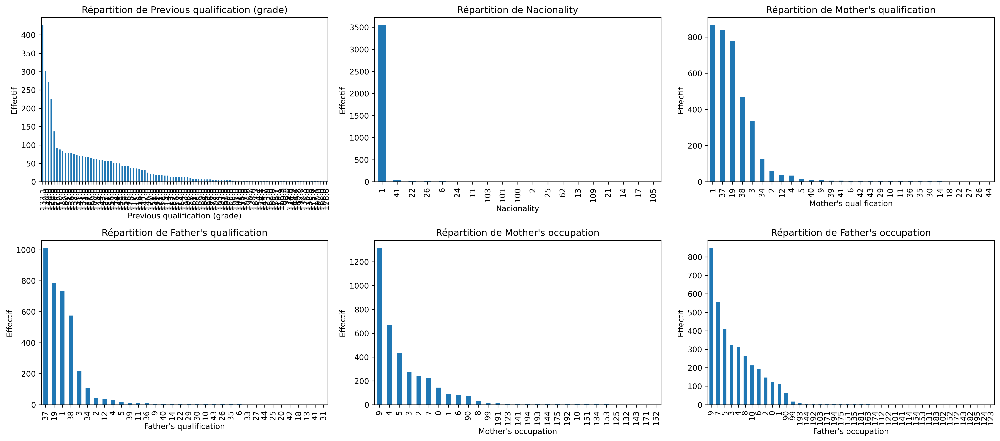

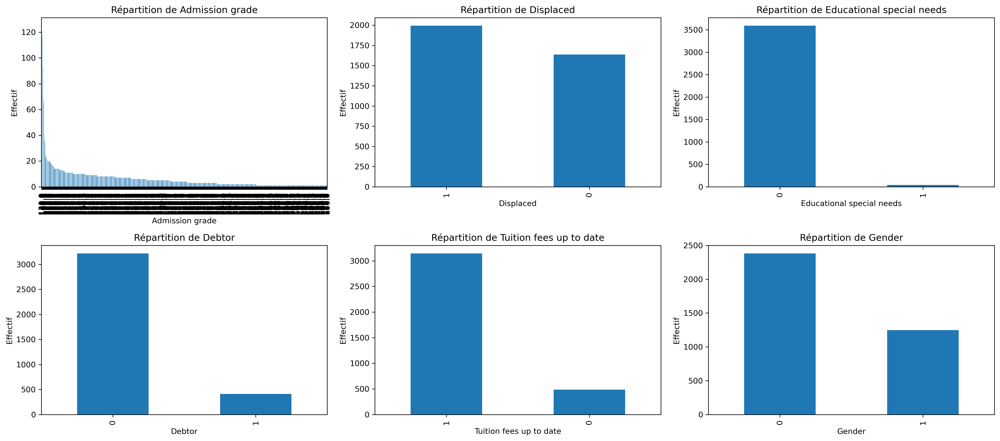

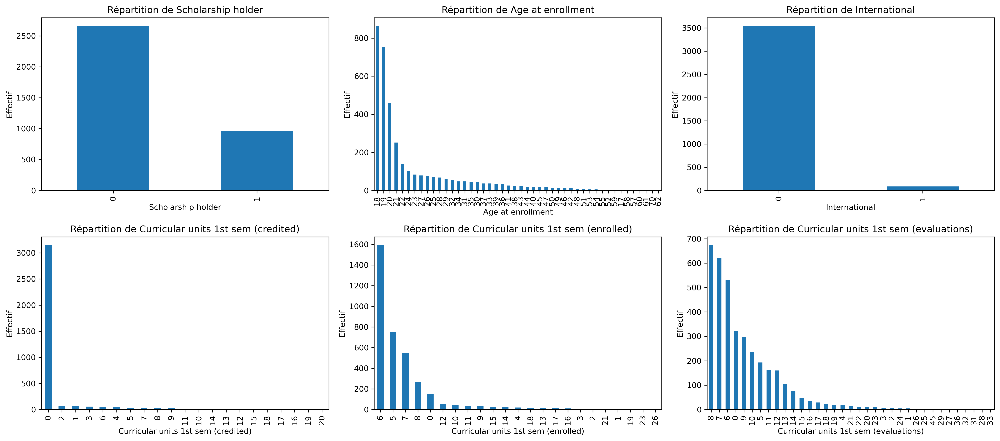

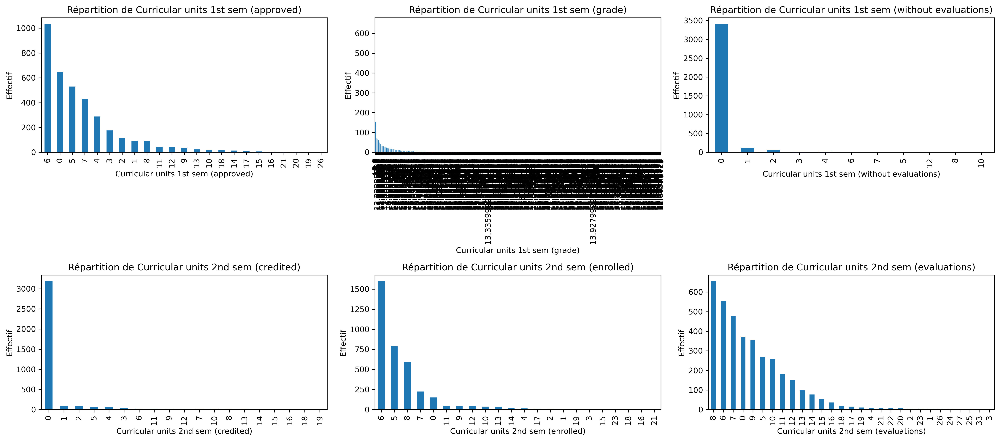

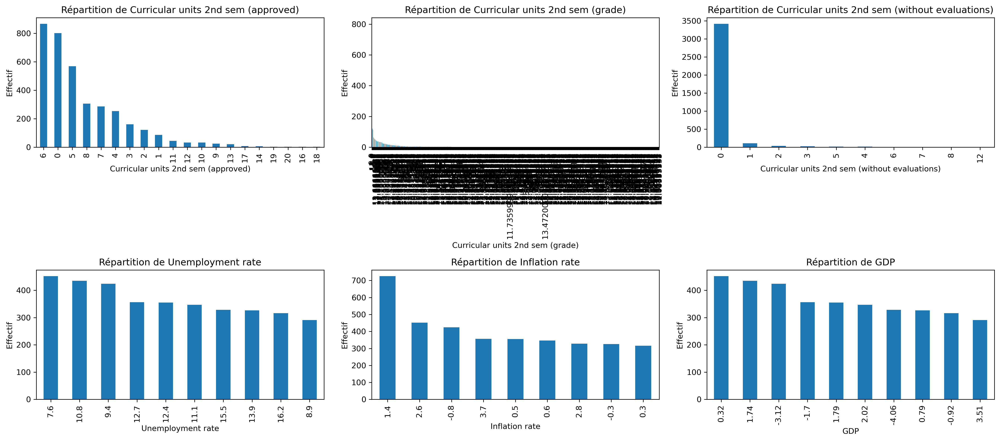

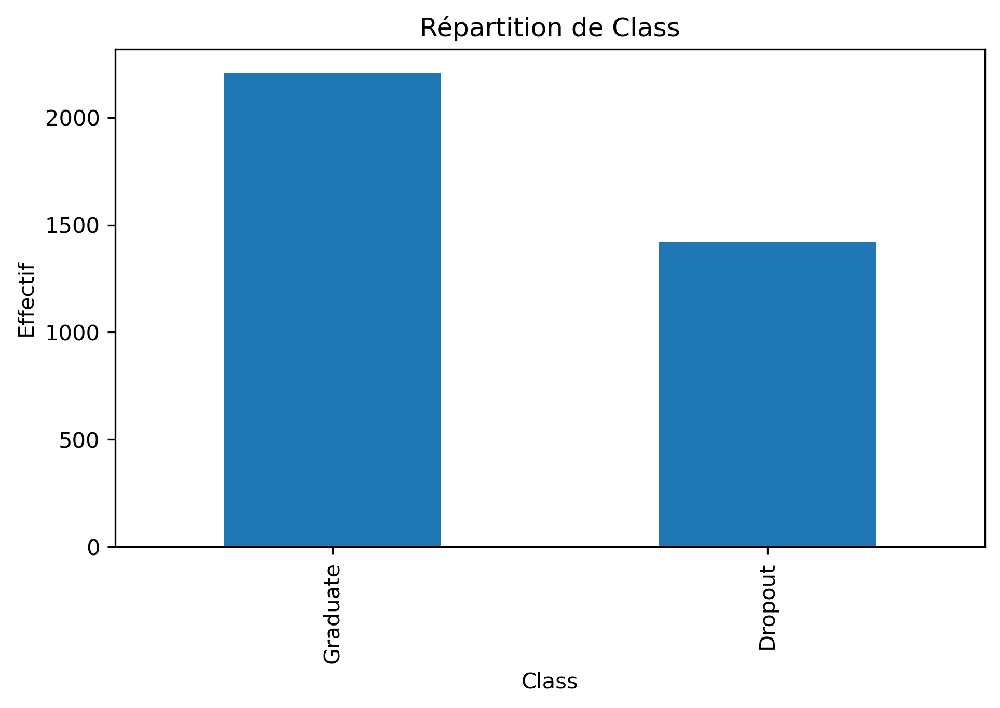

In [ ]:
#Nous allons maintenant voir toutes les données et leur répartition avec des boxplots afin de mieux les interpréter
cols = df_split.columns
n = len(cols)
plots_per_fig = 6

for i in range(0, n, plots_per_fig):
    fig, axes = plt.subplots(2, 3, figsize=(18, 8))
    axes = axes.flatten()
    for j, col in enumerate(cols[i:i+plots_per_fig]):
        ax = axes[j]
        if pd.api.types.is_numeric_dtype(df_split[col]):
            sns.histplot(df_split[col].dropna(), kde=True, ax=ax)
            ax.set_title(f"Distribution de {col}")
        else:
            df_split[col].value_counts().plot(kind='bar', ax=ax)
            ax.set_title(f"Répartition de {col}")
        ax.set_xlabel(col)
        ax.set_ylabel("Effectif")
    # Masquer les axes inutilisés
    for k in range(j+1, plots_per_fig):
        fig.delaxes(axes[k])
    plt.tight_layout()
    plt.show()

In [13]:
# Boxplots pour chaque variable numérique
num_cols = df_split.select_dtypes(include='number').columns
n = len(num_cols)
plots_per_fig = 6

for i in range(0, n, plots_per_fig):
    fig, axes = plt.subplots(2, 3, figsize=(18, 8))
    axes = axes.flatten()
    for j, col in enumerate(num_cols[i:i+plots_per_fig]):
        sns.boxplot(x=df_split[col], ax=axes[j])
        axes[j].set_title(f"Boxplot de {col}")
        axes[j].set_xlabel(col)
    # Masquer les axes inutilisés
    for k in range(j+1, plots_per_fig):
        fig.delaxes(axes[k])
    plt.tight_layout()
    plt.show()

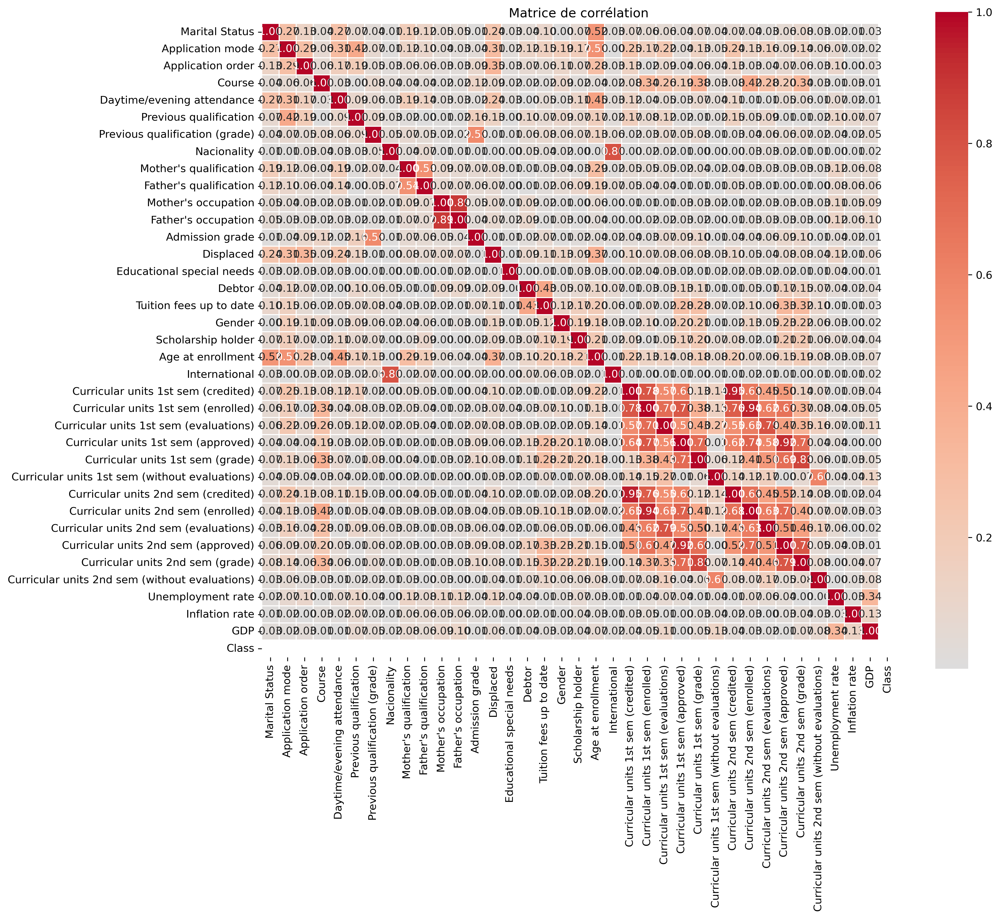

Aucune colonne avec corrélation absolue > 0.95 trouvée.
Nouvelle forme df_split : (3630, 37)
Nouvelle forme df_numeric : (3630, 37)


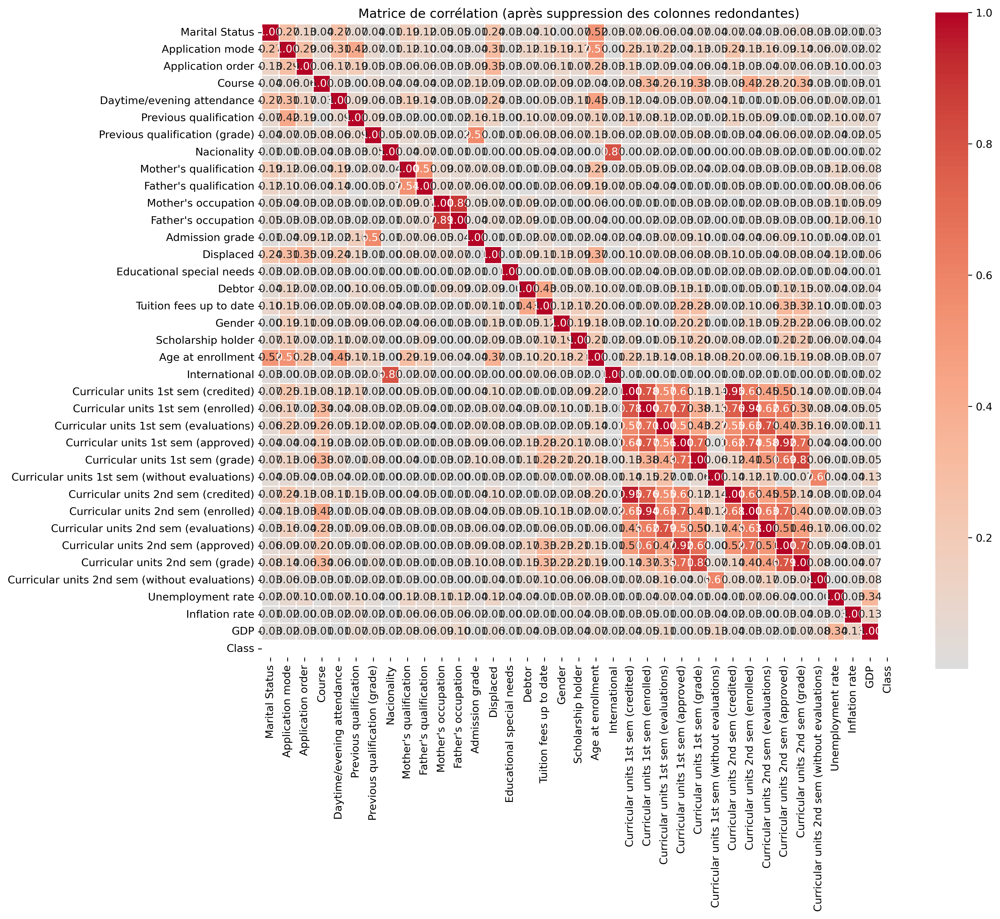

In [21]:
# Calculer la matrice de corrélation (valeurs absolues)
corr = df_numeric.corr().abs()
plt.figure(figsize=(14, 12))
sns.heatmap(corr, cmap='coolwarm', center=0, linewidths=0.5, annot=True, fmt='.2f', square=True)
plt.title('Matrice de corrélation')
plt.tight_layout()
plt.show()
# Détecter les colonnes fortement corrélées et ne garder qu'une parmi chaque paire
threshold = 0.95
upper = corr.where(np.triu(np.ones(corr.shape), k=1).astype(bool))
to_drop = [col for col in upper.columns if any(upper[col] > threshold)]

if to_drop:
    print(f"Colonnes redondantes (corr > {threshold}) supprimées :", to_drop)
    df_numeric = df_numeric.drop(columns=to_drop)
    df_split = df_split.drop(columns=to_drop)
else:
    print(f"Aucune colonne avec corrélation absolue > {threshold} trouvée.")

print("Nouvelle forme df_split :", df_split.shape)
print("Nouvelle forme df_numeric :", df_numeric.shape)

# Recalculer et afficher la matrice de corrélation après suppression
corr_reduced = df_numeric.corr().abs()
plt.figure(figsize=(14, 12))
sns.heatmap(corr_reduced, cmap='coolwarm', center=0, linewidths=0.5, annot=True, fmt='.2f', square=True)
plt.title('Matrice de corrélation (après suppression des colonnes redondantes)')
plt.tight_layout()
plt.show()

Ayant choisis un seuil de 0.95, on a detecté aucune correlation assez forte pour supprimer une colonnes.

Nos données ne présentent pas spécialement de problèmes, nous avons pas de données manquantes ni de données aberrantes ni de données trop corrélés. Nous allons donc pouvoir commencer à crée notre arbres de façon naive sans aucun critères d'optimisation.

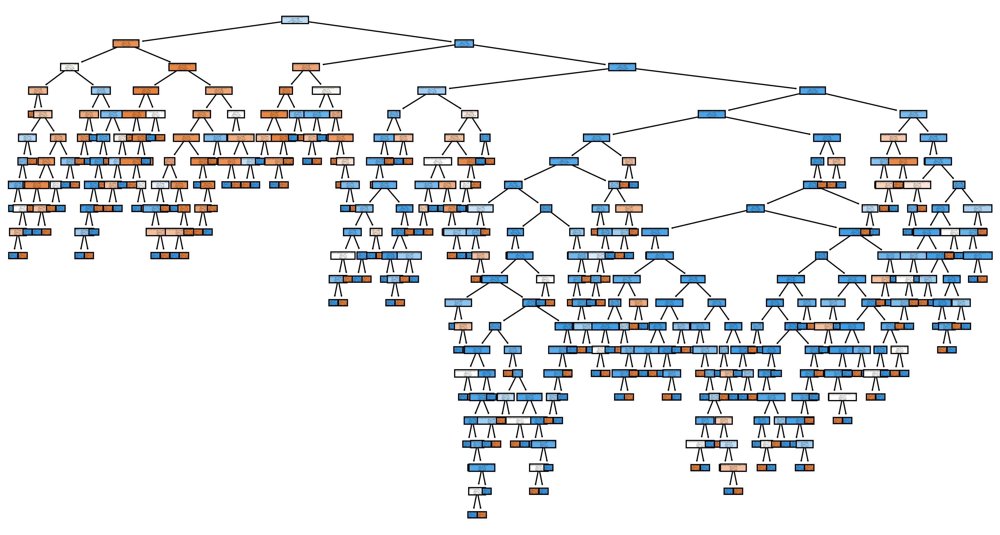

Accuracy sur le jeu de test : 0.85


In [ ]:
# Remplacez 'target' par le nom réel de votre colonne cible
X = df_split.drop('Class', axis=1)
y = df_split['Class']

# Séparation en train/test, 70/30
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Création et entraînement de l'arbre
clf = DecisionTreeClassifier(random_state=42)
clf.fit(X_train, y_train)

# Affichage de l'arbre
plt.figure(figsize=(15, 8))
plot_tree(clf, feature_names=X.columns, class_names=True, filled=True)
plt.show()

# Prédiction et score
score = clf.score(X_test, y_test)
print(f"Accuracy sur le jeu de test : {score:.2f}")

Meilleurs hyperparamètres : {'max_depth': 4, 'min_samples_leaf': 4, 'min_samples_split': 2}
Meilleure AUC (cross-validation) : 0.9198548202304881
AUC : 0.9084558955090356
AUC sur le jeu de test avec le meilleur modèle : 0.89


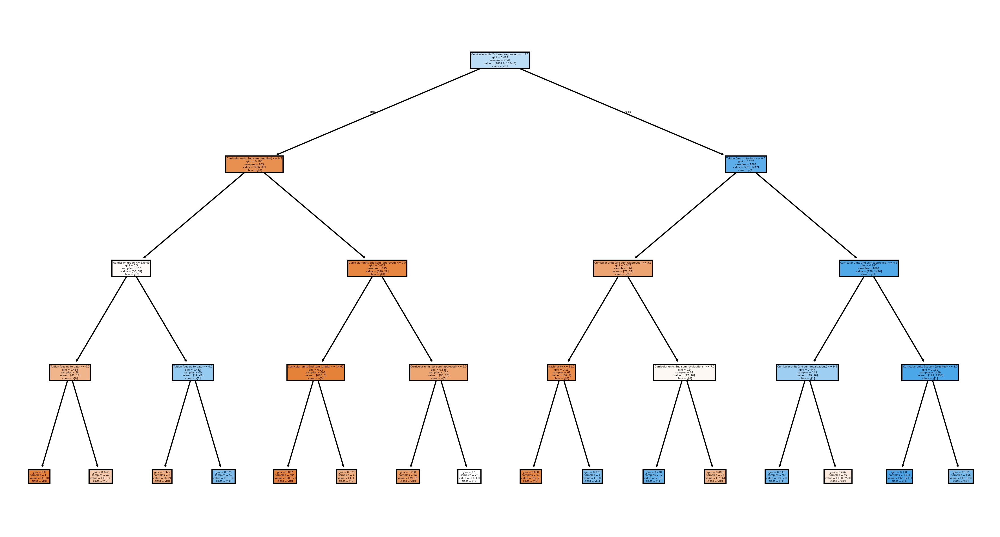

In [28]:
from sklearn.model_selection import GridSearchCV

# Définir la grille d'hyperparamètres à tester
param_grid = {
    'max_depth': [2, 4, 5 , 6, 8, 10, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Initialiser le classifieur
clf = DecisionTreeClassifier(random_state=42)

# GridSearch avec validation croisée (cv=5)
grid_search = GridSearchCV(clf, param_grid, cv=5, scoring='roc_auc')
grid_search.fit(X_train, y_train)

# Meilleurs paramètres trouvés
print("Meilleurs hyperparamètres :", grid_search.best_params_)
print("Meilleure AUC (cross-validation) :", grid_search.best_score_)

# Utiliser le meilleur modèle pour évaluer sur le test
best_clf = grid_search.best_estimator_
test_score = best_clf.score(X_test, y_test)
# Évaluation sur le test
from sklearn.metrics import roc_auc_score, precision_score, recall_score, f1_score

y_pred = best_clf.predict(X_test)
print("AUC :", roc_auc_score(y_test, best_clf.predict_proba(X_test)[:, 1]))
print(f"AUC sur le jeu de test avec le meilleur modèle : {test_score:.2f}")

# Affichage de l'arbre optimal
plt.figure(figsize=(15, 8))
plot_tree(best_clf, feature_names=X.columns, class_names=True, filled=True)
plt.show()

In [27]:
print("Précision :", precision_score(y_test, y_pred, pos_label='Graduate'))
print("Rappel :", recall_score(y_test, y_pred, pos_label='Graduate'))
print("F1-score :", f1_score(y_test, y_pred, pos_label='Graduate'))

Précision : 0.8870292887029289
Rappel : 0.9422222222222222
F1-score : 0.9137931034482759


AUC sur le jeu de test : 0.91


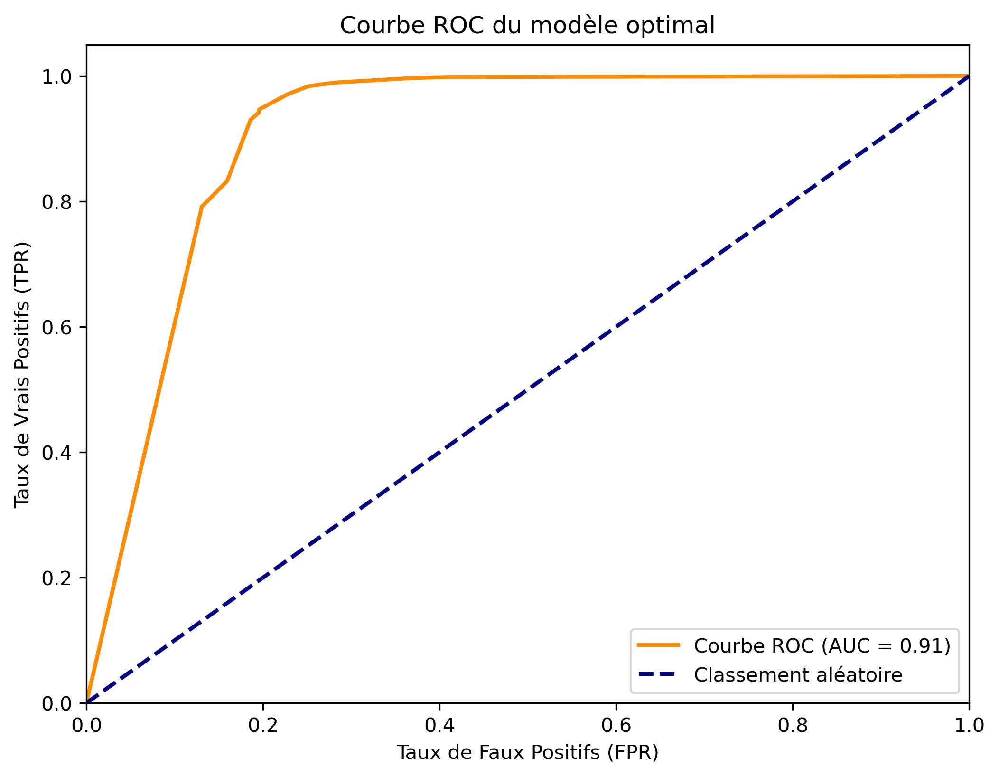

In [24]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

# Probabilités prédites par le meilleur modèle pour la classe positive
y_probs = best_clf.predict_proba(X_test)[:, 1]

# Calcul des taux de FPR, TPR et des seuils
fpr, tpr, thresholds = roc_curve(y_test, y_probs, pos_label="Graduate")

# Calcul de l’AUC
roc_auc = roc_auc_score(y_test, y_probs)
print(f"AUC sur le jeu de test : {roc_auc:.2f}")

# Tracé de la courbe ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'Courbe ROC (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Classement aléatoire')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Taux de Faux Positifs (FPR)')
plt.ylabel('Taux de Vrais Positifs (TPR)')
plt.title('Courbe ROC du modèle optimal')
plt.legend(loc='lower right')
plt.show()

c:\Users\victo\anaconda3new\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


=== Arbre de Décision ===
Accuracy : 0.8898071625344353
              precision    recall  f1-score   support

     Dropout       0.90      0.80      0.85       414
    Graduate       0.89      0.94      0.91       675

    accuracy                           0.89      1089
   macro avg       0.89      0.87      0.88      1089
weighted avg       0.89      0.89      0.89      1089

=== Régression Logistique ===
Accuracy : 0.9155188246097337
              precision    recall  f1-score   support

     Dropout       0.92      0.85      0.88       414
    Graduate       0.91      0.95      0.93       675

    accuracy                           0.92      1089
   macro avg       0.92      0.90      0.91      1089
weighted avg       0.92      0.92      0.91      1089



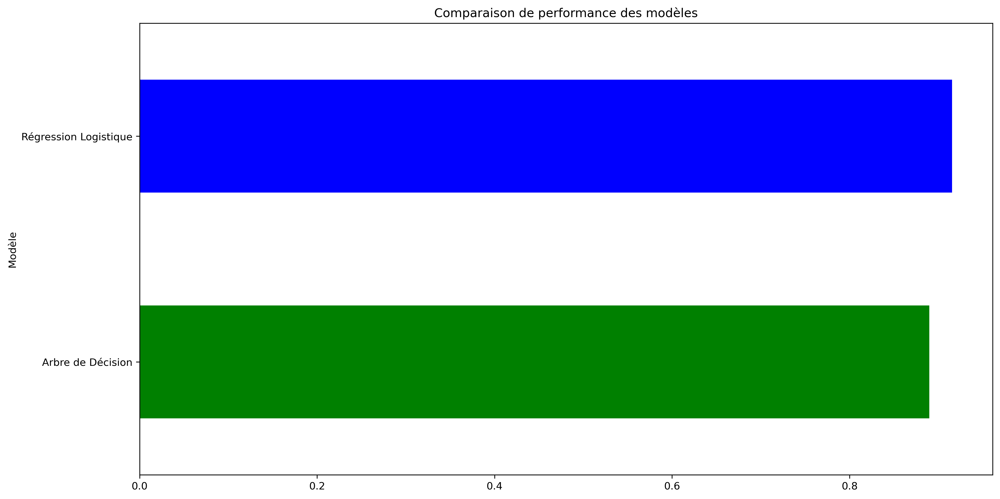

In [25]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score
# Modèle 1 : Arbre de décision
clf_tree = DecisionTreeClassifier(random_state=42)
clf_tree.fit(X_train, y_train)
y_pred_tree = grid_search.predict(X_test)

# Modèle 2 : Régression Logistique
clf_logreg = LogisticRegression(max_iter=1000, random_state=42)
clf_logreg.fit(X_train, y_train)
y_pred_logreg = clf_logreg.predict(X_test)

# Comparaison des performances
print("=== Arbre de Décision ===")
print("Accuracy :", accuracy_score(y_test, y_pred_tree))
print(classification_report(y_test, y_pred_tree))

print("=== Régression Logistique ===")
print("Accuracy :", accuracy_score(y_test, y_pred_logreg))
print(classification_report(y_test, y_pred_logreg))

# Graphique comparatif simple
scores = pd.DataFrame({
    "Modèle": ["Arbre de Décision", "Régression Logistique"],
    "Accuracy": [
        accuracy_score(y_test, y_pred_tree),
        accuracy_score(y_test, y_pred_logreg)
    ]
})
scores.plot(kind="barh", x="Modèle", y="Accuracy", color=["green", "blue"], legend=False)
plt.title("Comparaison de performance des modèles")
plt.show()

Partie 2

Meilleurs hyperparamètres (classique) : {'max_depth': 20, 'max_features': 'log2', 'min_samples_leaf': 2, 'n_estimators': 100}
Meilleure AUC CV : 0.950
Erreur (1 - OOB score) : 0.098
OOB score modèle élagué : 0.906

--- Évaluation forêt classique ---
              precision    recall  f1-score   support

     Dropout       0.92      0.82      0.87       277
    Graduate       0.90      0.96      0.93       449

    accuracy                           0.90       726
   macro avg       0.91      0.89      0.90       726
weighted avg       0.91      0.90      0.90       726



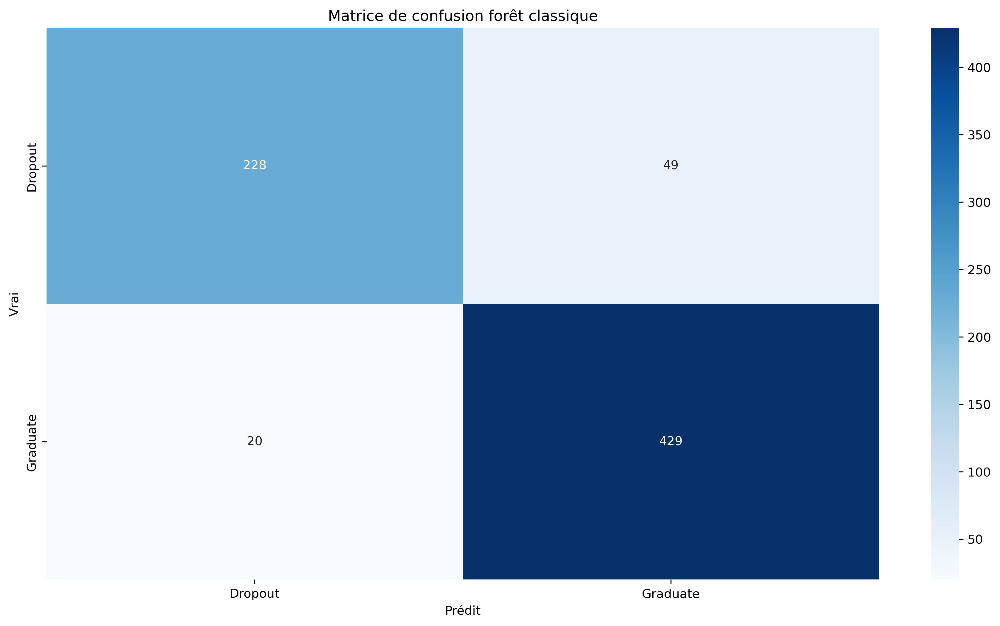

AUC forêt classique : 0.955


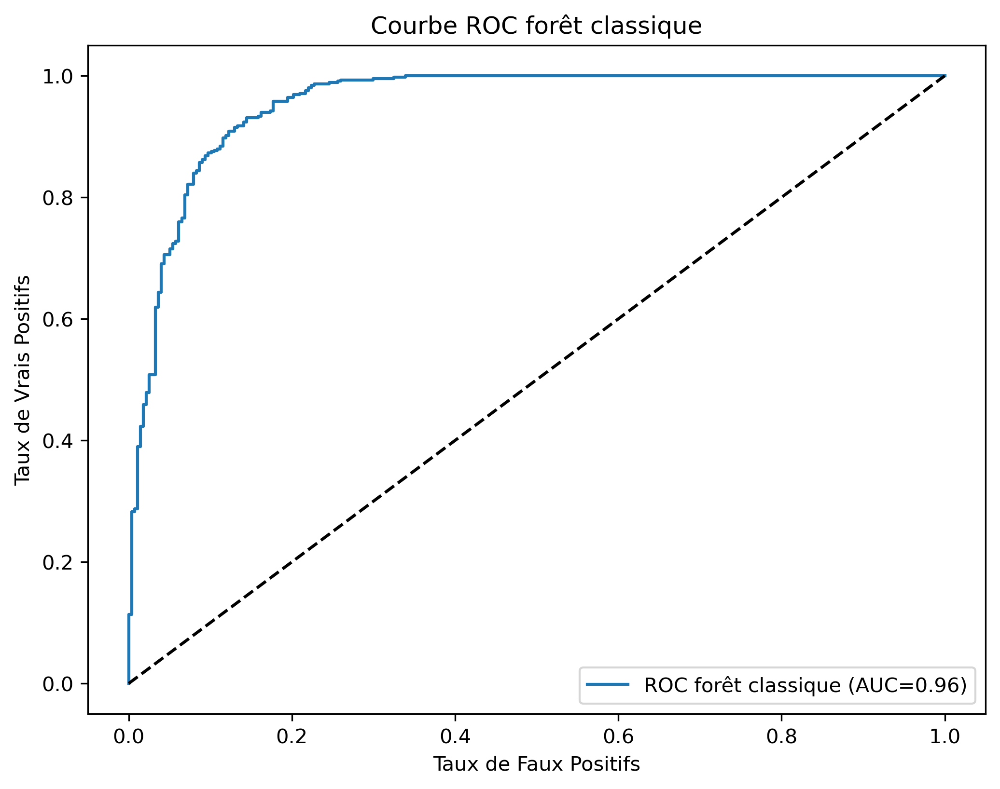


--- Évaluation forêt élaguée ---
              precision    recall  f1-score   support

     Dropout       0.92      0.82      0.86       277
    Graduate       0.90      0.95      0.92       449

    accuracy                           0.90       726
   macro avg       0.91      0.89      0.89       726
weighted avg       0.90      0.90      0.90       726



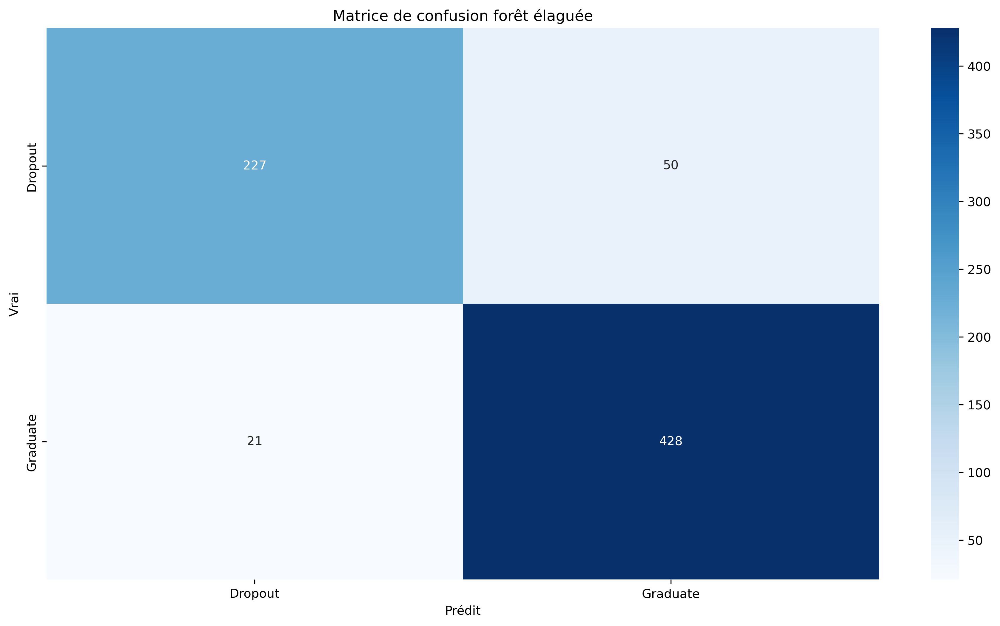

AUC forêt élaguée : 0.953


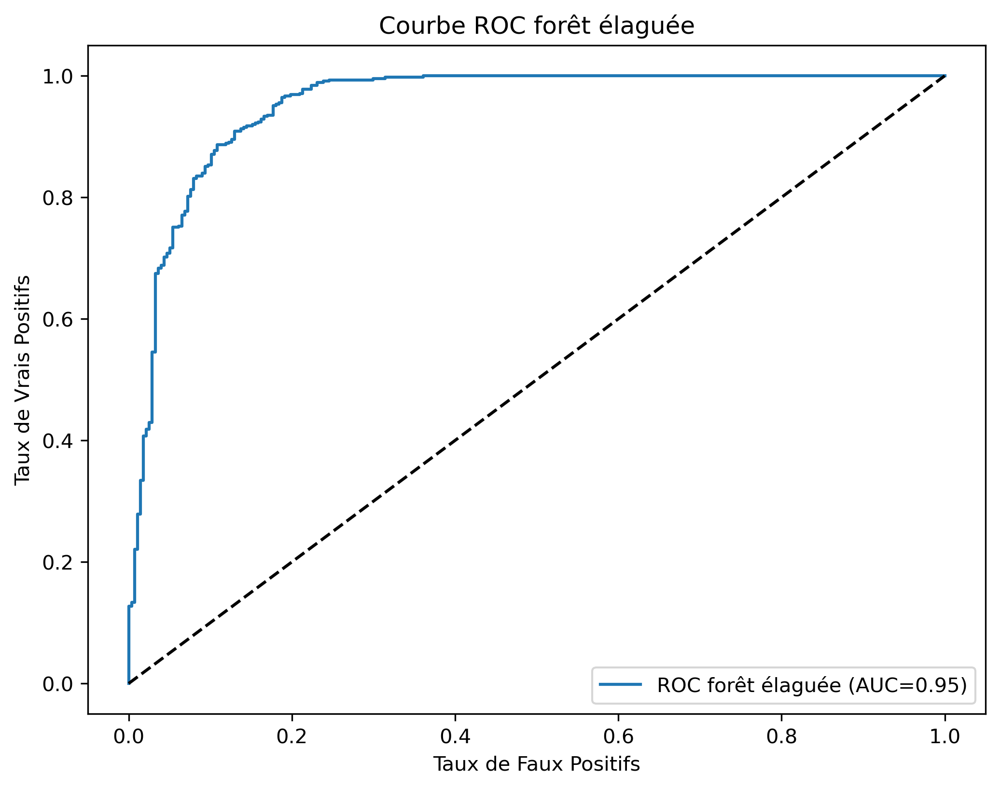

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, roc_auc_score
from sklearn.preprocessing import LabelEncoder

# Supposons que X, y contiennent tes données et la variable cible
# Encode la variable cible si nécessaire (labels non numériques)
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# Séparation train/test
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# ---------------------------
# Première implémentation : Forêt aléatoire classique avec OOB et GridSearch
# ---------------------------
rf = RandomForestClassifier(oob_score=True, random_state=42)

# Grille de recherche hyperparamètres - Out-of-Sample estimation
param_grid = {
    'n_estimators': [100, 200, 50],
    'max_depth': [None, 10, 20, 5],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['log2', 'sqrt',None]
}

grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, scoring='roc_auc', n_jobs=-1,error_score='raise')
grid_search.fit(X_train, y_train)

print("Meilleurs hyperparamètres (classique) :", grid_search.best_params_)
print(f"Meilleure AUC CV : {grid_search.best_score_:.3f}")

best_rf_classic = grid_search.best_estimator_

# Estimation OOB du modèle classique
print(f"Erreur (1 - OOB score) : {1 - best_rf_classic.oob_score_:.3f}")

# ---------------------------
# Deuxième implémentation : Forêt avec contraintes (élagage indirect)
# ---------------------------
rf_pruned = RandomForestClassifier(
    n_estimators=200,
    max_depth=10,  # limitation profondeur
    min_samples_leaf=4,  # feuilles plus grandes=modèle plus simple
    max_features='sqrt',
    oob_score=True,
    random_state=42
)
rf_pruned.fit(X_train, y_train)

print(f"OOB score modèle élagué : {rf_pruned.oob_score_:.3f}")

# Évaluation sur le jeu test pour les 2 modèles
def evaluate_model(model, X_test, y_test, title_suffix=""):
    y_pred = model.predict(X_test)
    y_probs = model.predict_proba(X_test)[:, 1]

    print(f"\n--- Évaluation {title_suffix} ---")
    print(classification_report(y_test, y_pred, target_names=le.classes_))

    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=le.classes_, yticklabels=le.classes_)
    plt.title(f"Matrice de confusion {title_suffix}")
    plt.xlabel("Prédit")
    plt.ylabel("Vrai")
    plt.show()

    fpr, tpr, _ = roc_curve(y_test, y_probs)
    auc_score = roc_auc_score(y_test, y_probs)
    print(f"AUC {title_suffix} : {auc_score:.3f}")

    plt.figure(figsize=(8,6))
    plt.plot(fpr, tpr, label=f'ROC {title_suffix} (AUC={auc_score:.2f})')
    plt.plot([0,1],[0,1],'k--')
    plt.xlabel("Taux de Faux Positifs")
    plt.ylabel("Taux de Vrais Positifs")
    plt.title(f"Courbe ROC {title_suffix}")
    plt.legend()
    plt.show()

# Évaluer modèle classique
evaluate_model(best_rf_classic, X_test, y_test, "forêt classique")

# Évaluer modèle élagué
evaluate_model(rf_pruned, X_test, y_test, "forêt élaguée")



In [30]:
import xgboost as xgb
from sklearn.datasets import make_classification

X, y = make_classification(n_samples=1000, n_features=10, random_state=42)
dtrain = xgb.DMatrix(X, label=y)

params = {
   "objective": "binary:logistic",
   "eval_metric": "logloss",
   "num_parallel_tree": 100,  # nombre d'arbres en forêt aléatoire
   "subsample": 0.8,
   "colsample_bytree": 0.8,
   "seed": 42,
   "tree_method": "hist"
}
bst = xgb.train(params, dtrain, num_boost_round=1)


ModuleNotFoundError: No module named 'xgboost'

Partie 3

In [31]:
KPI = pd.read_csv("KPIs for telecommunication.csv",sep=';')
print(KPI.head())
print(KPI.describe())
KPI = KPI.apply(pd.to_numeric)
print('min', KPI.min())
print('max', KPI.max() )
print('étendue', KPI.max() - KPI.min())
print('moyenne',KPI.mean())
print('Variance', KPI.var())


    KPI1  KPI2      KPI3   KPI4     KPI5  KPI6    KPI7  KPI8   KPI9     KPI10
0  100.0  0.51    255826  100.0   464882   0.0     760   0.0  100.0    752896
1  100.0  2.01  44096226  100.0  3529790   0.0   12920   0.0  100.0  60808621
2  100.0  5.01   6993836  100.0   572966   0.0  151840   0.0  100.0   7782017
3  100.0  0.51      7838  100.0     4055   0.0       0   0.0  100.0     23733
4  100.0  0.99  14418925  100.0  1345729   0.0    4760   0.0  100.0  15524056
              KPI1         KPI2          KPI3        KPI4          KPI5  \
count  1365.000000  1365.000000  1.365000e+03  864.000000  1.365000e+03   
mean     75.914277    14.966571  3.427450e+07   99.964796  7.614980e+06   
std      42.347881    33.294258  9.851706e+07    0.703317  1.903238e+07   
min       0.000000     0.000000  0.000000e+00   80.000000  0.000000e+00   
25%      92.308000     0.000000  9.090000e+02  100.000000  8.580000e+02   
50%     100.000000     1.500000  3.012590e+05  100.000000  1.745170e+05   
75%    

In [ ]:
print('Variance', KPI.var())


Variance KPI1     1.793343e+03
KPI2     1.108508e+03
KPI3     9.705612e+15
KPI4     4.946543e-01
KPI5     3.622315e+14
KPI6     8.391225e+00
KPI7     7.798518e+09
KPI8     4.755130e-01
KPI9     5.522680e-01
KPI10    1.246970e+16
dtype: float64


Recherche des valeurs manquantes

In [32]:
# Compter les valeurs NA par colonne
na_par_colonne = KPI.isna().sum()
print("Valeurs NA par colonne :")
print(na_par_colonne)
# Compter le nombre de zéros par colonne
zeros_par_colonne = (KPI == 0).sum()
print("Nombre de zéros par colonne :")
print(zeros_par_colonne)

Valeurs NA par colonne :
KPI1       0
KPI2       0
KPI3       0
KPI4     501
KPI5       0
KPI6     282
KPI7       0
KPI8       0
KPI9     382
KPI10      0
dtype: int64
Nombre de zéros par colonne :
KPI1      323
KPI2      511
KPI3      301
KPI4        0
KPI5      313
KPI6      894
KPI7      569
KPI8     1324
KPI9        0
KPI10     241
dtype: int64


Il existe beaucoup d'erreur NA, on suppose que c'est normal d'avoir des valeurs nulles.

In [33]:
from sklearn.impute import KNNImputer
from sklearn.metrics import mean_absolute_error, mean_squared_error

# 1. Séparation train/test
X_train, X_test = train_test_split(KPI, test_size=0.2, random_state=42)

# 2. Simuler des valeurs manquantes dans X_train (ex : 10% aléatoire)
np.random.seed(42)
missing_rate = 0.1
X_train_missing = X_train.copy()

mask = np.random.rand(*X_train_missing.shape) < missing_rate
X_train_missing = X_train_missing.mask(mask)

# Conserver les données originales complètes pour comparaison des valeurs masquées
X_train_complete = X_train.copy()

# 3a. Imputer par la médiane
median_imputed = X_train_missing.fillna(X_train_missing.median())

# 3b. Imputer par KNN (avec k=5)
knn_imputer = KNNImputer(n_neighbors=5)
knn_imputed_array = knn_imputer.fit_transform(X_train_missing)
knn_imputed = pd.DataFrame(knn_imputed_array, columns=X_train.columns, index=X_train.index)

# 4. Évaluer l’imputation : calcul MAE, RMSE sur les valeurs masquées uniquement

def eval_imputation(imputed_df, original_df, mask):
    # Crée un masque booléen sans NaN
    valid_mask = mask & original_df.notna() & imputed_df.notna()
    valid_mask = valid_mask.fillna(False)

    # Extraire uniquement les colonnes numériques
    numeric_cols = original_df.select_dtypes(include=[np.number]).columns

    # Extraction stricte des valeurs selon masque et colonnes numériques
    original_vals = original_df.loc[valid_mask.index, numeric_cols].where(valid_mask[numeric_cols])
    imputed_vals = imputed_df.loc[valid_mask.index, numeric_cols].where(valid_mask[numeric_cols])

    # Aplatir et supprimer encore les NaN sinécessaire
    orig_flat = original_vals.stack().values
    imput_flat = imputed_vals.stack().values

    # Vérifier absence de NaN restant
    if np.isnan(orig_flat).any() or np.isnan(imput_flat).any():
        raise ValueError("NaN détecté dans les valeurs utilisées pour l’évaluation après extraction stricte.")

    mae = mean_absolute_error(orig_flat, imput_flat)
    rmse = mean_squared_error(orig_flat, imput_flat, squared=False)
    return mae, rmse




masked_positions = mask & X_train_complete.notna()
print(median_imputed.isna().sum().sum())  # Doit afficher 0
print(knn_imputed.isna().sum().sum())     # Doit afficher 0
mae_median, rmse_median = eval_imputation(median_imputed, X_train_complete, masked_positions)
mae_knn, rmse_knn = eval_imputation(knn_imputed, X_train_complete, masked_positions)

print(f"Imputation médiane - MAE: {mae_median:.4f} | RMSE: {rmse_median:.4f}")
print(f"Imputation k-NN - MAE: {mae_knn:.4f} | RMSE: {rmse_knn:.4f}")


0
0
Imputation médiane - MAE: 8755476.8672 | RMSE: 48598624.9485
Imputation k-NN - MAE: 9596390.4794 | RMSE: 41513780.9367


c:\Users\victo\anaconda3new\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\victo\anaconda3new\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Imputation médiane - MAE: 8755476.8672 | RMSE: 48598624.9485
Imputation k-NN - MAE: 9596390.4794 | RMSE: 41513780.9367
On va donc choisir la méthode d'imputation des médianes

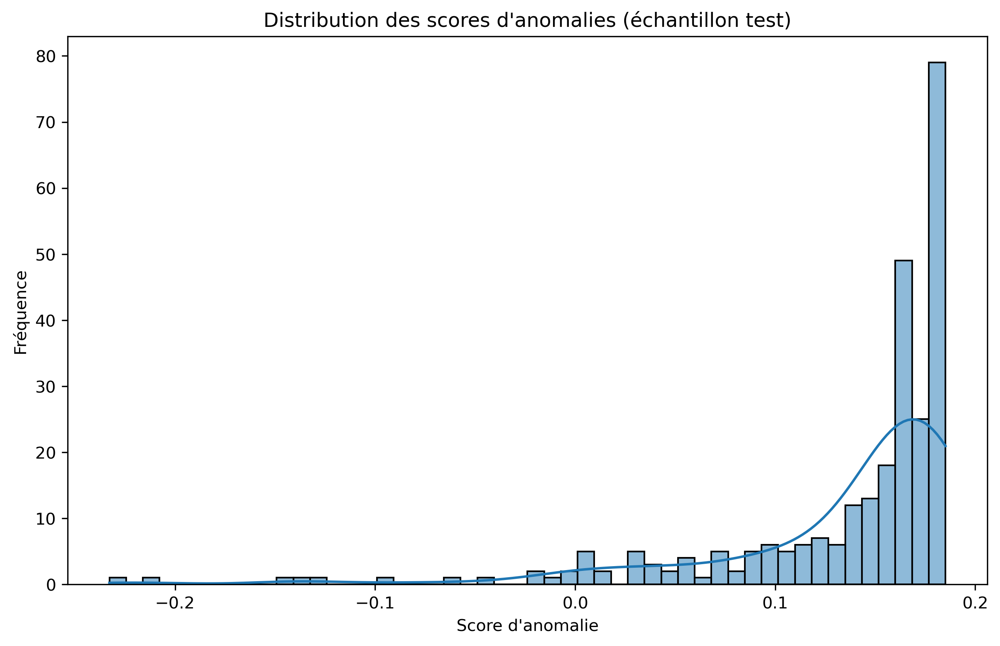

Score test - Moyenne : 0.1356, Écart-type : 0.0682
Nombre d'inliers dans test: 260
Nombre d'outliers dans test: 13


In [35]:
import pandas as pd
from sklearn.ensemble import IsolationForest
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Imputation des valeurs NA par la médiane
KPI_imputed = KPI.fillna(KPI.median())

# 2. Séparation train/test
X_train, X_test = train_test_split(KPI_imputed, test_size=0.2, random_state=42)

# 3. Création et entraînement de la forêt d'isolement
model = IsolationForest(
    n_estimators=100,
    max_samples='auto',
    contamination='auto',
    random_state=42,
    n_jobs=-1
)
model.fit(X_train)

# 4. Calcul des scores d’anomalie sur train et test
scores_train = model.decision_function(X_train)
scores_test = model.decision_function(X_test)

# 5. Prédictions d'anomalies
pred_train = model.predict(X_train)
pred_test = model.predict(X_test)

# 6. Visualisation de la distribution des scores sur l’échantillon test
plt.figure(figsize=(10, 6))
sns.histplot(scores_test, bins=50, kde=True)
plt.title("Distribution des scores d'anomalies (échantillon test)")
plt.xlabel("Score d'anomalie")
plt.ylabel("Fréquence")
plt.show()

# 7. Analyse statistique simple des scores test
print(f"Score test - Moyenne : {scores_test.mean():.4f}, Écart-type : {scores_test.std():.4f}")
print(f"Nombre d'inliers dans test: {(pred_test == 1).sum()}")
print(f"Nombre d'outliers dans test: {(pred_test == -1).sum()}")


In [36]:
import numpy as np

# Supposons que pred_test, X_test, KPImputed, X_train, model sont déjà définis

# 1. Récupérer les indices d'origine des outliers dans X_test
outliers_idx = X_test[pred_test == -1].index

# 2. Trouver leurs positions dans X_test
positions = [X_test.index.get_loc(idx) for idx in outliers_idx]

# 3. Récupérer les scores négatifs retournés par score_samples
scores_neg = model.score_samples(X_test)

# Constante c(n) selon la théorie d'Isolation Forest
def c(n):
    if n > 2:
        import numpy as np
        return 2 * (np.log(n - 1) + 0.5772156649) - 2 * (n - 1) / n
    elif n == 2:
        return 1
    else:
        return 0

n = len(X_train)
c_n = c(n)

# 4. Transformer les scores négatifs en scores positifs
scores_pos = 2 ** (scores_neg)

# 5. Extraire les 5 premiers scores positifs correspondant aux outliers
first_5_scores_pos = scores_pos[positions[:5]]

# 6. Calculer la longueur moyenne (path length)
path_lengths = -c_n * np.log2(first_5_scores_pos)

# 7. Afficher les 5 premières lignes des outliers dans le DataFrame imputé
print("5 premiers outliers - données :")
print(KPI_imputed.loc[outliers_idx[:5]])

# 8. Afficher les scores positifs (proches de 0 = anomalie forte)
print("\nScores d'anomalie transformés des 5 premiers outliers :")
print(first_5_scores_pos)

# 9. Afficher la profondeur moyenne (longueur moyenne d'isolation)
print("\nProfondeur moyenne d'isolation (path length) des 5 premiers outliers :")
print(path_lengths)




5 premiers outliers - données :
        KPI1    KPI2       KPI3   KPI4       KPI5   KPI6    KPI7   KPI8  \
924   99.687  115.02  185394056  100.0   37942236  0.000   99200  0.000   
704   99.602  204.00  700464532  100.0  141627720  0.000  502880  0.000   
932  100.000    7.02  197871096  100.0   12558404  0.536   97600  0.254   
946   99.793  164.01  157398376  100.0   40947638  0.068  230400  0.000   
679   99.773   41.49  900583010  100.0   60397305  0.000  141160  0.000   

        KPI9      KPI10  
924   99.929  244539620  
704  100.000  822157450  
932  100.000  241133510  
946  100.000  201703973  
679  100.251  982963150  

Scores d'anomalie transformés des 5 premiers outliers :
[0.706513   0.61102702 0.70484012 0.69658219 0.64191678]

Profondeur moyenne d'isolation (path length) des 5 premiers outliers :
[6.58891402 9.34272961 6.63387419 6.85738791 8.40739308]


Les résultats que tu obtiens montrent maintenant des valeurs cohérentes et interprétables :

Les scores d’anomalie 
s
(
x
)
s(x) des 5 premiers outliers sont entre 0.61 et 0.69, ce qui correspond à un niveau d’anomalie modéré à élevé (plus proche de 1 = plus anormal).

Les profondeurs moyennes d’isolation (longueur moyenne des chemins) sont comprises entre environ 7.1 et 9.3, ce qui signifie que ces observations ont été isolées assez rapidement dans les arbres. En effet, plus la profondeur moyenne est faible, plus l’observation est facilement isolée et donc anormale.

Explication générale
L’algorithme d’Isolation Forest s’appuie sur l’idée que les observations atypiques (outliers) sont plus rapidement séparées dans les arbres aléatoires car elles sont distantes des autres points. Cette rapidité d’isolation se traduit par une profondeur faible (longueur moyenne courte), d’où un score s(x) proche de 1.

Interprétations spécifiques
Les s(x) autour de 0.6-0.7 indiquent des anomalies détectées clairement (dans la pratique, un seuil de contamination typique est autour de 0.05 ou 0.1).

Les longueurs de chemins entre 7 et 9 correspondent à la moyenne des nombres de splits nécessaires pour isoler ces points. Ces valeurs sont cohérentes avec des anomalies, car les points normaux ont des longueurs de parcours plus élevées.

Cette correspondance confirme que ta transformation et calcul sont bien réalisés.

In [58]:
import numpy as np
import pandas as pd

# Supposons pred_test, scores_neg, X_test, KPI_imputed, X_train, model déjà définis

# 1. Constante c(n)
def c(n):
    if n > 2:
        return 2 * (np.log(n - 1) + 0.5772156649) - 2 * (n - 1) / n
    elif n == 2:
        return 1
    else:
        return 0

n = len(X_train)
c_n = c(n)

# 2. Transformer scores négatifs retournés par score_samples en positifs
scores_pos = 2 ** scores_neg

# 3. Sélectionner les indices des inliers
inliers_idx = X_test[pred_test == 1].index

# 4. Trouver positions dans X_test
positions = [X_test.index.get_loc(idx) for idx in inliers_idx]

# 5. Extraire scores positifs pour inliers
inliers_scores_pos = scores_pos[positions]

# 6. Trouver indices des 5 plus faibles scores (les plus normaux)
inliers_scores_series = pd.Series(inliers_scores_pos, index=inliers_idx)
lowest_5_idx = inliers_scores_series.nsmallest(5).index
lowest_5_positions = [X_test.index.get_loc(idx) for idx in lowest_5_idx]

# 7. Extraire scores et calculer profondurs moyenne des 5 plus normaux
first_5_scores_pos = scores_pos[lowest_5_positions]
path_lengths = -c_n * np.log2(first_5_scores_pos)

# 8. Afficher résultats
print("5 observations inliers les plus normales :")
print(KPI_imputed.loc[lowest_5_idx])

print("\nScores d'anomalie transformés des 5 plus normales :")
print(first_5_scores_pos)

print("\nProfondeur moyenne d'isolation (path length) des 5 plus normales :")
print(path_lengths)




5 observations inliers les plus normales :
        KPI1    KPI2       KPI3   KPI4      KPI5   KPI6    KPI7   KPI8  \
670   98.276   78.51  163607215  100.0  28018767  2.778   65240  0.000   
946   99.793  164.01  157398376  100.0  40947638  0.068  230400  0.000   
677   99.688  153.99   88033801  100.0  29820402  0.000  250124  0.000   
932  100.000    7.02  197871096  100.0  12558404  0.536   97600  0.254   
924   99.687  115.02  185394056  100.0  37942236  0.000   99200  0.000   

        KPI9      KPI10  
670  100.000  188780596  
946  100.000  201703973  
677   99.892  120567366  
932  100.000  241133510  
924   99.929  244539620  

Scores d'anomalie transformés des 5 plus normales :
[0.69629918 0.69658219 0.70255693 0.70484012 0.706513  ]

Profondeur moyenne d'isolation (path length) des 5 plus normales :
[6.86509492 6.85738791 6.69540931 6.63387419 6.58891402]


In [60]:
import numpy as np

# Supposons :
# scores_neg : np.array des scores négatifs retournés par model.score_samples(X_test)
# n : taille de l'échantillon d'entraînement X_train

def c(n):
    if n > 2:
        return 2 * (np.log(n - 1) + 0.5772156649) - 2 * (n - 1) / n
    elif n == 2:
        return 1
    else:
        return 0

c_n = c(n)

# Transformation des scores négatifs en positifs scores_pos dans [0,1]
scores_pos = 2 ** scores_neg

# 5 scores les plus bas (outliers potentiels)
lowest_5_pos = np.sort(scores_pos)[-5:]
lowest_5_path_len = -c_n * np.log2(lowest_5_pos)

# 5 scores les plus hauts (inliers typiques)
highest_5_pos = np.sort(scores_pos)[:5]
highest_5_path_len = -c_n * np.log2(highest_5_pos)

# Affichage
print("5 scores d'anomalie les plus bas :")
print(lowest_5_pos)
print("Longueurs moyennes d'isolation associées :")
print(lowest_5_path_len)

print("\n5 scores d'anomalie les plus hauts :")
print(highest_5_pos)
print("Longueurs moyennes d'isolation associées :")
print(highest_5_path_len)


5 scores d'anomalie les plus bas :
[0.80382629 0.80387441 0.80387441 0.80393331 0.80393331]
Longueurs moyennes d'isolation associées :
[4.14156097 4.14042573 4.14042573 4.13903614 4.13903614]

5 scores d'anomalie les plus hauts :
[0.60172073 0.61102702 0.64021166 0.64191678 0.64581061]
Longueurs moyennes d'isolation associées :
[9.63380895 9.34272961 8.45783827 8.40739308 8.29269614]
